In [1]:
import pathlib

import matplotlib as mpl
import plotly.express as pex
import polars as pl
import seaborn as sea
from matplotlib import pyplot as plt
from plotly import graph_objects as go
from plotly import io as pio

In [2]:
pio.renderers.default = "notebook"

In [3]:
mpl.use("module://mplcairo.base")

In [4]:
%load_ext autoreload

In [5]:
%autoreload 2

from ods_mlops.eda.plotting import heat_map, scatter_plot, to_iimage

In [6]:
mpl.rc("figure", figsize=(7, 7), dpi=150)

In [7]:
sea.set_theme(style="dark")

In [8]:
data_path = pathlib.Path("data", "2015-street-tree-census-tree-data.csv")

In [9]:
bool_columns = [
    "root_stone",
    "root_grate",
    "root_other",
    "trunk_wire",
    "trnk_light",
    "trnk_other",
    "brch_light",
    "brch_shoe",
    "brch_other",
]

In [10]:
data = (
    pl.scan_csv(
        data_path,
        encoding="utf8",
        dtypes={
            "created_at": pl.Datetime,
        },
        null_values="None",
    )
    .with_columns(
        pl.col(col).map_elements({"Yes": True, "No": False}.get, return_dtype=pl.Boolean)
        for col in bool_columns
    )
    .collect()
)

In [11]:
data.head(n=3)

tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,guards,sidewalk,user_type,problems,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,address,postcode,zip_city,community board,borocode,borough,cncldist,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
i64,i64,datetime[μs],i64,i64,str,str,str,str,str,str,str,str,str,str,bool,bool,bool,bool,bool,bool,bool,bool,bool,str,i64,str,i64,i64,str,i64,i64,i64,str,str,i64,str,f64,f64,f64,f64,i64,i64,i64,i64
180683,348711,2015-08-27 00:00:00,3,0,"""OnCurb""","""Alive""","""Fair""","""Acer rubrum""","""red maple""",null,null,"""NoDamage""","""TreesCount Sta…",null,false,false,false,false,false,false,false,false,false,"""108-005 70 AVE…",11375,"""Forest Hills""",406,4,"""Queens""",29,28,16,"""QN17""","""Forest Hills""",4073900,"""New York""",40.723092,-73.844215,1.0274e6,202756.7687,29,739,4052307,4022210001
200540,315986,2015-09-03 00:00:00,21,0,"""OnCurb""","""Alive""","""Fair""","""Quercus palust…","""pin oak""",null,null,"""Damage""","""TreesCount Sta…","""Stones""",true,false,false,false,false,false,false,false,false,"""147-074 7 AVEN…",11357,"""Whitestone""",407,4,"""Queens""",19,27,11,"""QN49""","""Whitestone""",4097300,"""New York""",40.794111,-73.818679,1.0345e6,228644.8374,19,973,4101931,4044750045
204026,218365,2015-09-05 00:00:00,3,0,"""OnCurb""","""Alive""","""Good""","""Gleditsia tria…","""honeylocust""","""1or2""",null,"""Damage""","""Volunteer""",null,false,false,false,false,false,false,false,false,false,"""390 MORGAN AVE…",11211,"""Brooklyn""",301,3,"""Brooklyn""",34,50,18,"""BK90""","""East Williamsb…",3044900,"""New York""",40.717581,-73.936608,1.0018e6,200716.8913,34,449,3338310,3028870001


In [27]:
data.glimpse(max_items_per_column=6)

Rows: 683788
Columns: 45
$ tree_id                   <i64> 180683, 200540, 204026, 204337, 189565, 190422
$ block_id                  <i64> 348711, 315986, 218365, 217969, 223043, 106099
$ created_at       <datetime[μs]> 2015-08-27 00:00:00, 2015-09-03 00:00:00, 2015-09-05 00:00:00, 2015-09-05 00:00:00, 2015-08-30 00:00:00, 2015-08-30 00:00:00
$ tree_dbh                  <i64> 3, 21, 3, 10, 21, 11
$ stump_diam                <i64> 0, 0, 0, 0, 0, 0
$ curb_loc                  <str> 'OnCurb', 'OnCurb', 'OnCurb', 'OnCurb', 'OnCurb', 'OnCurb'
$ status                    <str> 'Alive', 'Alive', 'Alive', 'Alive', 'Alive', 'Alive'
$ health                    <str> 'Fair', 'Fair', 'Good', 'Good', 'Good', 'Good'
$ spc_latin                 <str> 'Acer rubrum', 'Quercus palustris', 'Gleditsia triacanthos var. inermis', 'Gleditsia triacanthos var. inermis', 'Tilia americana', 'Gleditsia triacanthos var. inermis'
$ spc_common                <str> 'red maple', 'pin oak', 'honeylocust', 'honeylocust

In [28]:
data.describe()

statistic,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,steward,guards,sidewalk,user_type,problems,root_stone,root_grate,root_other,trunk_wire,trnk_light,trnk_other,brch_light,brch_shoe,brch_other,address,postcode,zip_city,community board,borocode,borough,cncldist,st_assem,st_senate,nta,nta_name,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
str,f64,f64,str,f64,f64,str,str,str,str,str,str,str,str,str,str,f64,f64,f64,f64,f64,f64,f64,f64,f64,str,f64,str,f64,f64,str,f64,f64,f64,str,str,f64,str,f64,f64,f64,f64,f64,f64,f64,f64
"""count""",683788.0,683788.0,"""683788""",683788.0,683788.0,"""683788""","""683788""","""652172""","""652169""","""652169""","""164350""","""79866""","""652172""","""683788""","""225844""",683788.0,683788.0,683788.0,683788.0,683788.0,683788.0,683788.0,683788.0,683788.0,"""683788""",683788.0,"""683788""",683788.0,683788.0,"""683788""",683788.0,683788.0,683788.0,"""683788""","""683788""",683788.0,"""683788""",683788.0,683788.0,683788.0,683788.0,677269.0,677269.0,674229.0,674229.0
"""null_count""",0.0,0.0,"""0""",0.0,0.0,"""0""","""0""","""31616""","""31619""","""31619""","""519438""","""603922""","""31616""","""0""","""457944""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""0""",0.0,"""0""",0.0,0.0,"""0""",0.0,0.0,0.0,"""0""","""0""",0.0,"""0""",0.0,0.0,0.0,0.0,6519.0,6519.0,9559.0,9559.0
"""mean""",365205.011085,313793.096236,"""2015-12-06 07:…",11.279787,0.432463,null,null,null,null,null,null,null,null,null,null,0.20474,0.005171,0.044344,0.019412,0.001508,0.047636,0.091205,0.000601,0.035618,null,10916.246044,null,343.505404,3.3585,null,29.943181,50.791583,20.615781,null,null,3.4049e6,null,40.701261,-73.92406,1.0053e6,194798.424625,30.02733,11957.368422,3.4954e6,3.4134e9
"""std""",208122.092902,114839.024312,null,8.723042,3.290241,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,651.553364,null,115.740601,1.166746,null,14.328531,18.96652,7.390844,null,null,1.1759e6,null,0.090311,0.123583,34285.054478,32902.061114,14.301717,30745.739811,1.1933e6,1.1749e9
"""min""",3.0,100002.0,"""2015-05-19 00:…",0.0,0.0,"""OffsetFromCurb…","""Alive""","""Fair""","""Acer""","""'Schubert' cho…","""1or2""","""Harmful""","""Damage""","""NYC Parks Staf…","""BranchLights""",0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,"""0 5 AVENUE""",83.0,"""Arverne""",101.0,1.0,"""Bronx""",1.0,23.0,10.0,"""BK09""","""Allerton-Pelha…",1.000201e6,"""New York""",40.498466,-74.254965,913349.2661,120973.7922,1.0,1.0,1e6,0.0
"""25%""",186583.0,221556.0,"""2015-08-29 00:…",4.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,10451.0,null,302.0,3.0,null,19.0,33.0,14.0,null,null,3.0117e6,null,40.631929,-73.9805,989657.8947,169515.1554,19.0,202.0,3.031991e6,3.0112e9
"""50%""",366215.0,319967.0,"""2015-10-23 00:…",9.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,11214.0,null,402.0,4.0,null,30.0,52.0,21.0,null,null,4.0081e6,null,40.700612,-73.912911,1.0084e6,194560.2586,30.0,516.0,4.020352e6,4.0086e9
"""75%""",546170.0,404624.0,"""2016-02-06 00:…",16.0,0.0,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,null,11365.0,null,412.0,4.0,null,43.0,64.0,25.0,null,null,4.103202e6,null,40.762228,-73.834911,1.0300e6,217019.4837,43.0,1417.0,4.263123e6,4.1057e9
"""max""",722694.0,9.99999e5,"""2016-10-05 00:…",450.0,140.0,"""OnCurb""","""Stump""","""Poor""","""Zelkova serrat…","""willow oak""","""4orMore""","""Unsure""","""NoDamage""","""Volunteer""","""WiresRope,Trun…",1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,1.0,"""9999 SHORE ROA…",11697.0,"""Woodside""",503.0,5.0,"""Staten Island""",51.0,87.0,36.0,"""SI54""","""Yorkville""",5.0323e6,"""New York""",40.912918,-73.700488,1.0672e6,271894.0921,51.0,157903.0,5.515124e6,5.0805e9


# Пропущенные значения

In [29]:
fig = plt.figure()
ax = fig.add_subplot(111)

sea.barplot(
    data.null_count()
    .transpose(include_header=True, header_name="col_name")
    .filter(pl.col("column_0") > 0)
    .with_columns(pl.col("column_0") / len(data)),
    x="col_name",
    y="column_0",
    ax=ax,
)
ax.set_ylabel("Доля")
ax.tick_params(axis="x", rotation=70);

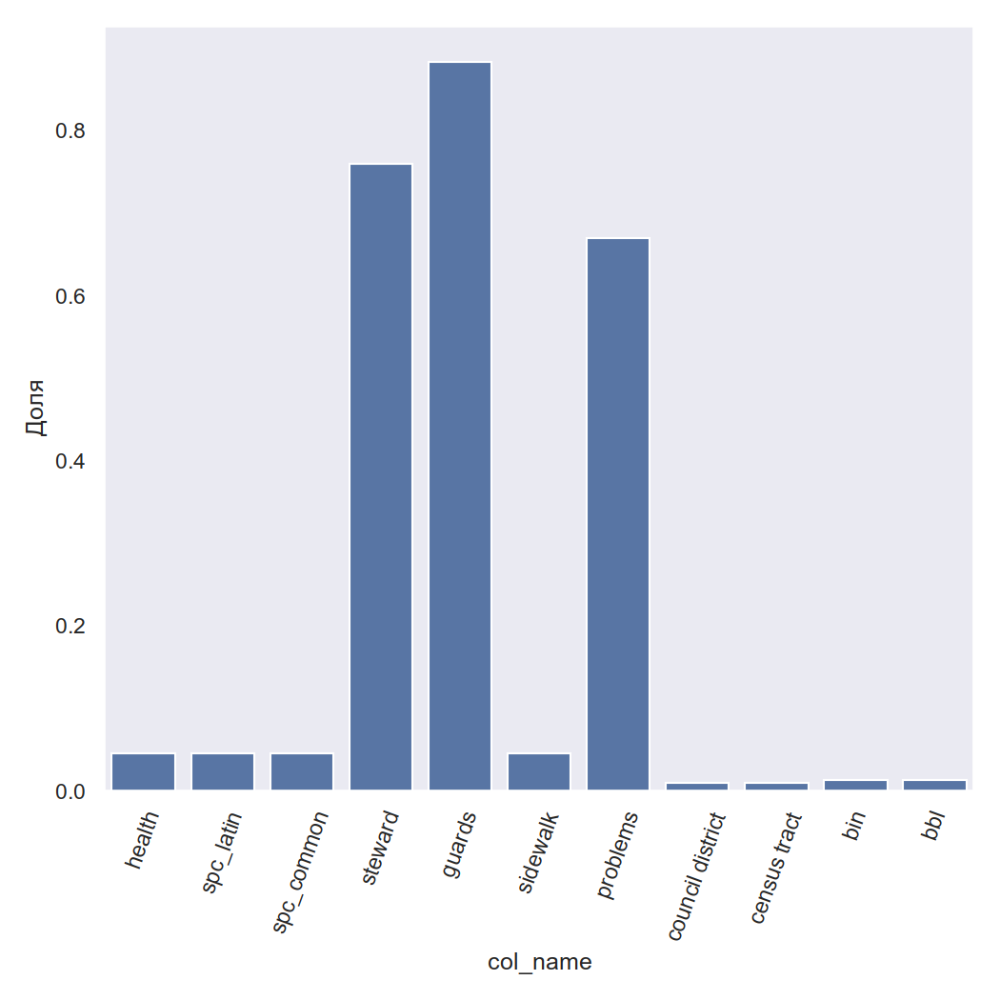

In [30]:
to_iimage(fig)

# Распределение числа деревьев по уровню "здоровья"

In [31]:
mapping = {1: "Manhattan", 2: "Bronx", 3: "Brooklyn", 4: "Queens", 5: "Staten Islan"}

In [32]:
data = data.with_columns(
    pl.col("borocode").replace(mapping, return_dtype=pl.String).alias("boroname")
)

In [33]:
grid = sea.relplot(
    data.lazy()
    .with_columns(
        pl.col("created_at").dt.year().alias("year"), pl.col("created_at").dt.month().alias("month")
    )
    .group_by("year", "boroname", "month", "health")
    .agg(pl.n_unique("tree_id").alias("num_uniq_trees"))
    .collect(),
    x="month",
    y="num_uniq_trees",
    row="boroname",
    col="year",
    kind="line",
    hue="health",
)

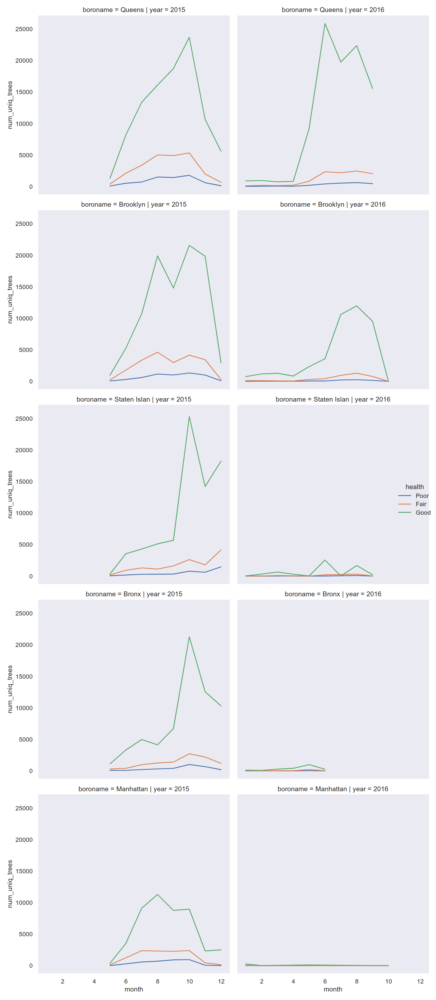

In [34]:
to_iimage(grid.figure)

In [35]:
fig = plt.figure()
ax = fig.add_subplot(111)

sea.scatterplot(data, x="x_sp", y="y_sp", hue="status", ax=ax)

<Axes: xlabel='x_sp', ylabel='y_sp'>

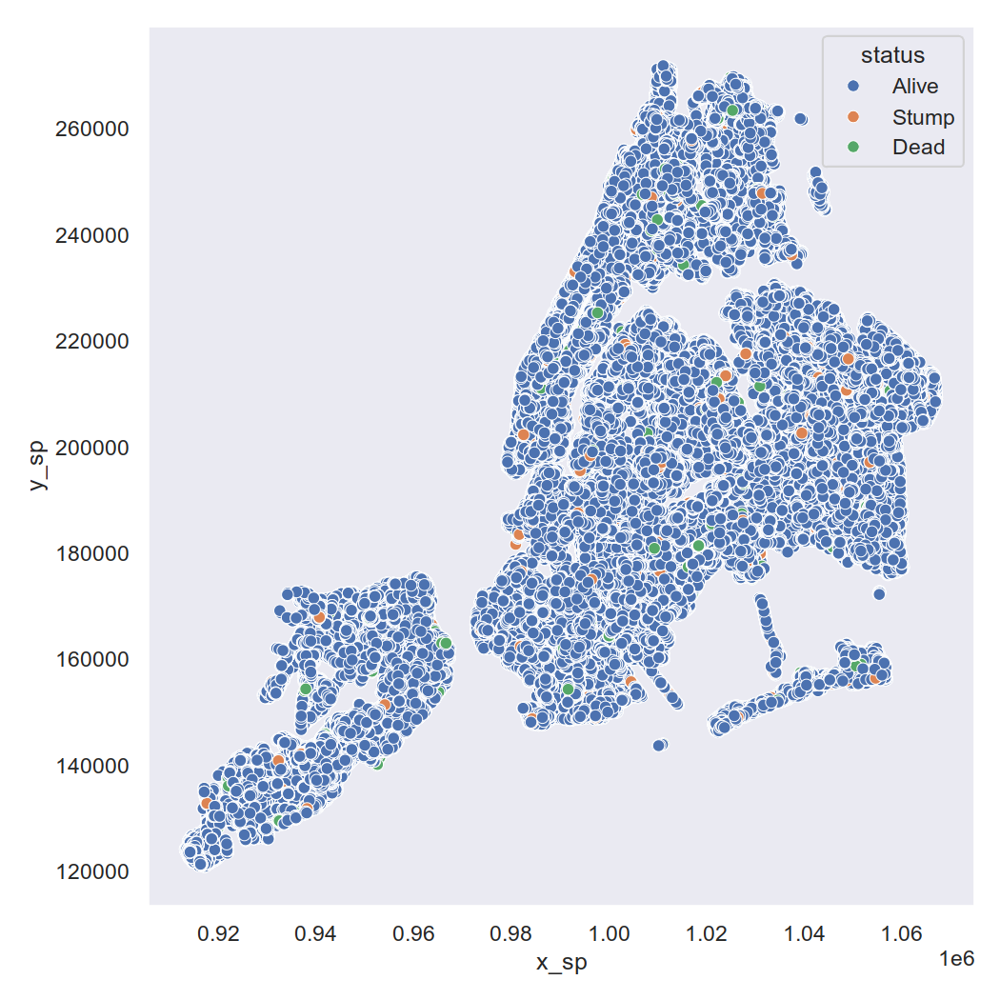

In [36]:
to_iimage(fig)

In [37]:
fig = plt.figure()
ax = fig.add_subplot(111)

In [38]:
sea.scatterplot(data, x="x_sp", y="y_sp", hue="health", ax=ax)

<Axes: xlabel='x_sp', ylabel='y_sp'>

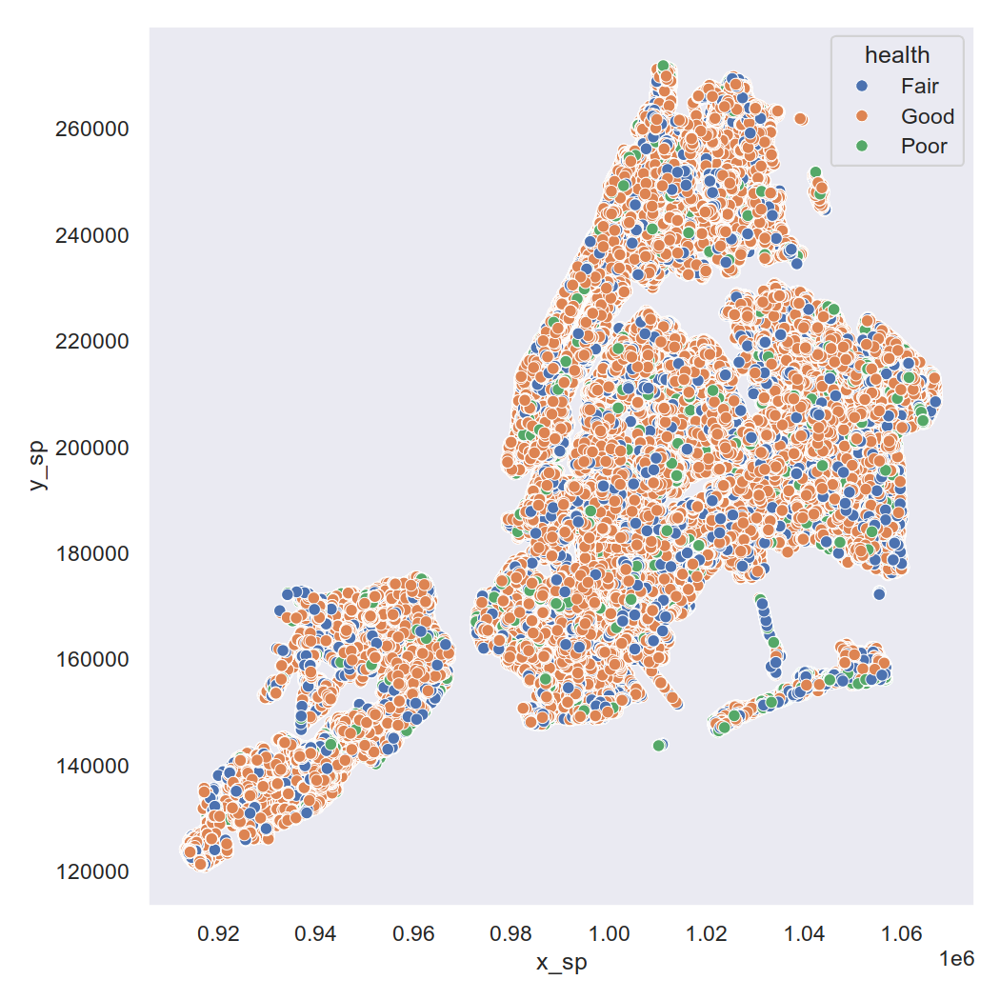

In [39]:
to_iimage(fig)

# Корреляции

In [40]:
corr_data = data.select(pl.col("tree_dbh", "stump_diam", "x_sp", "y_sp")).corr()

In [41]:
fig = plt.figure()
ax = fig.add_subplot(111)

In [42]:
heat_map(pl.concat([pl.DataFrame({"name": corr_data.columns}), corr_data], how="horizontal"), ax=ax)

<Axes: >

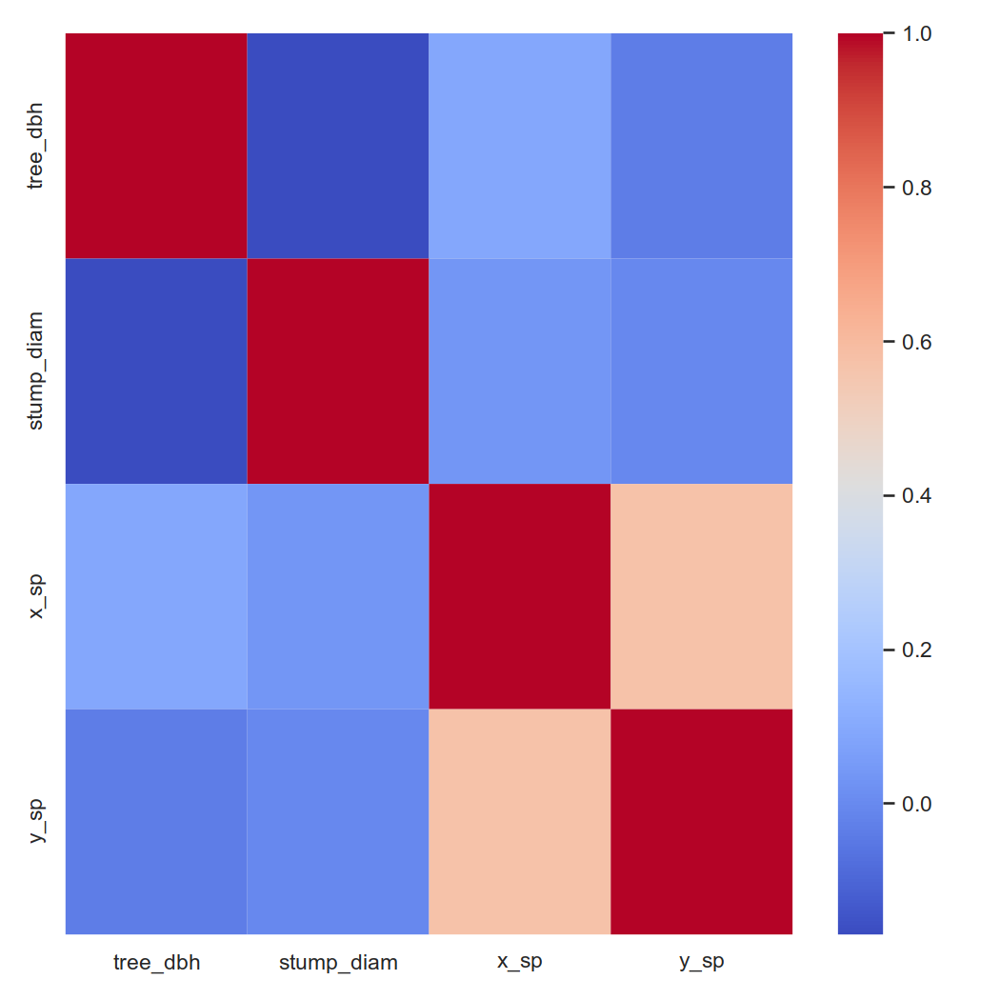

In [43]:
to_iimage(fig)

# Визуализация на карте

Показаны только 30 % данных для производительности.

In [12]:
geo_data = data.sample(fraction=0.3, seed=2323)

In [13]:
fig = pex.scatter_mapbox(
    geo_data,
    lat="latitude",
    lon="longitude",
    color="health",
    hover_name="health",
    hover_data=["status"],
    category_orders={"health": ["Fair", "Good", "Poor"]},
    color_discrete_sequence=["green", "blue", "red"],
    zoom=3,
    height=600,
)

In [14]:
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(
    mapbox_bounds={
        "west": geo_data.get_column("longitude").min() - 0.25,
        "east": geo_data.get_column("longitude").max() + 0.25,
        "south": geo_data.get_column("latitude").min() - 0.25,
        "north": geo_data.get_column("latitude").max() + 0.25,
    }
);

In [15]:
fig.show()